# Environtment Setup

In [ ]:
import tensorflow as tf
import keras

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.callbacks import EarlyStopping

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.metrics import confusion_matrix
import seaborn as sns
import pandas as pd
import numpy as np
import os
import shutil
import random
from PIL import Image

import warnings
warnings.filterwarnings('ignore')

In [ ]:
print("TensorFlow version: ", tf.__version__)
print("Keras version: ", keras. __version__)

TensorFlow version:  2.17.1
Keras version:  3.5.0


# Exploratory Data Analysis

In [ ]:
# Download Dataset from kaggle using API key
!pip install opendatasets

import opendatasets as od
od.download("https://www.kaggle.com/datasets/kaustubhb999/tomatoleaf")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: alexandroaurellino
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/kaustubhb999/tomatoleaf


100%|██████████| 179M/179M [00:09<00:00, 19.6MB/s]


In [ ]:
# Define the dataset paths
train_dir = '/content/tomatoleaf/tomato/train'
val_dir = '/content/tomatoleaf/tomato/val'
test_dir = "/content/tomatoleaf/tomato/test"

In [ ]:
# Create the test directory if it doesn't exist
if not os.path.exists(test_dir):
    os.makedirs(test_dir)

# Create subdirectories and move images
for class_name in os.listdir(val_dir):
    class_val_path = os.path.join(val_dir, class_name)
    class_test_path = os.path.join(test_dir, class_name)

    # Create subdirectory for each class in the test folder
    if not os.path.exists(class_test_path):
        os.makedirs(class_test_path)

    # Get all images in the validation class folder
    images = [f for f in os.listdir(class_val_path) if os.path.isfile(os.path.join(class_val_path, f))]

    # Check which images are already in the test set
    test_images = [f for f in os.listdir(class_test_path) if os.path.isfile(os.path.join(class_test_path, f))]

    # Ensure we only move images that are not already in the test set
    available_images = [img for img in images if img not in test_images]

    # Randomly select 10 images that are not yet in the test set
    selected_images = random.sample(available_images, min(10, len(available_images)))

    # Move selected images to the test directory
    for image in selected_images:
        src_path = os.path.join(class_val_path, image)
        dest_path = os.path.join(class_test_path, image)
        shutil.move(src_path, dest_path)

print("Test dataset created successfully!")

# Get the class labels from the training directory
train_class_labels = os.listdir(train_dir)

# Function to sync class folders
def sync_class_folders(source_dir, target_dir, class_labels):
    for label in class_labels:
        source_class_path = os.path.join(source_dir, label)
        target_class_path = os.path.join(target_dir, label)

        # Create the class folder in the target directory if it doesn't exist
        if not os.path.exists(target_class_path):
            os.makedirs(target_class_path)

# Sync class folders for validation and test directories
sync_class_folders(train_dir, val_dir, train_class_labels)
sync_class_folders(train_dir, test_dir, train_class_labels)

print("Class folders synced successfully!")

Test dataset created successfully!
Class folders synced successfully!


In [ ]:
# Get the class labels
class_labels = os.listdir(train_dir)

# Function to print total images for each label in a directory
def print_image_counts(data_dir, class_labels):
    print(f"Image counts for directory: {data_dir}")
    for label in class_labels:
        class_path = os.path.join(data_dir, label)
        num_images = len(os.listdir(class_path))
        print(f"{label:50}: {num_images} images")
    print("\n")

# Print image counts for train, validation, and test directories
print_image_counts(train_dir, class_labels)
print_image_counts(val_dir, class_labels)
print_image_counts(test_dir, class_labels)

Image counts for directory: /content/tomatoleaf/tomato/train
Tomato___Tomato_mosaic_virus                      : 1000 images
Tomato___Target_Spot                              : 1000 images
Tomato___healthy                                  : 1000 images
Tomato___Bacterial_spot                           : 1000 images
Tomato___Spider_mites Two-spotted_spider_mite     : 1000 images
Tomato___Leaf_Mold                                : 1000 images
Tomato___Septoria_leaf_spot                       : 1000 images
Tomato___Late_blight                              : 1000 images
Tomato___Early_blight                             : 1000 images
Tomato___Tomato_Yellow_Leaf_Curl_Virus            : 1000 images


Image counts for directory: /content/tomatoleaf/tomato/val
Tomato___Tomato_mosaic_virus                      : 90 images
Tomato___Target_Spot                              : 90 images
Tomato___healthy                                  : 90 images
Tomato___Bacterial_spot                           : 

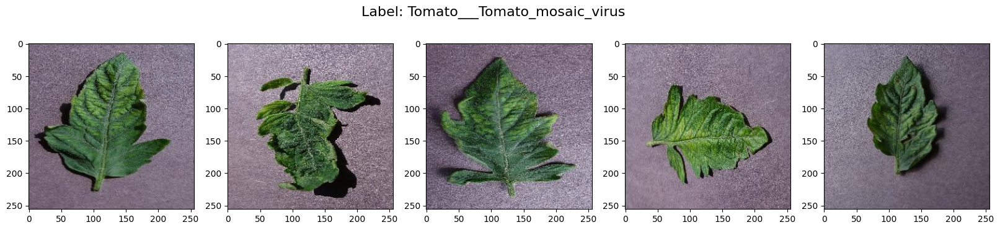

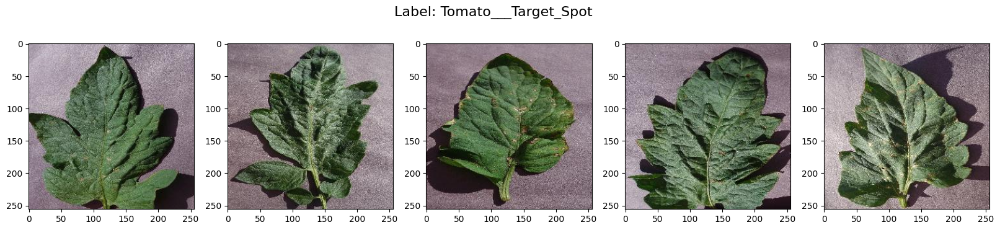

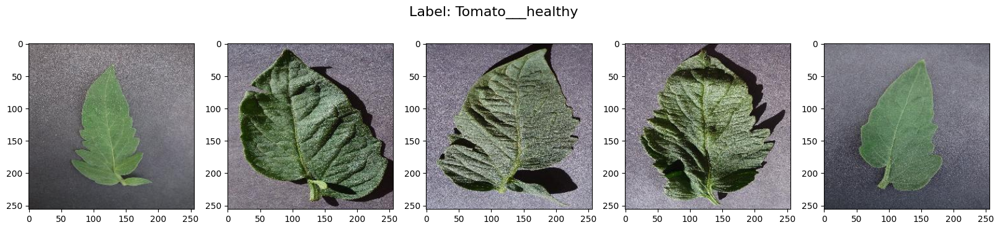

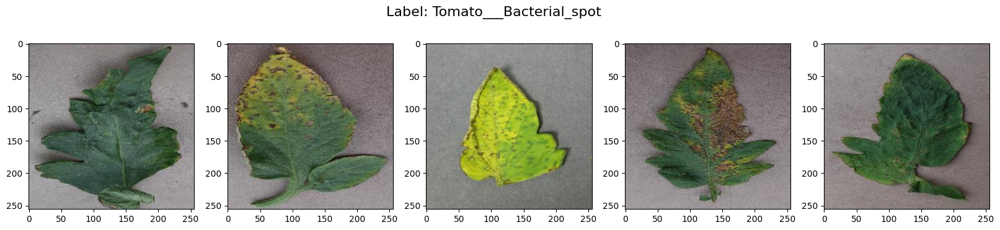

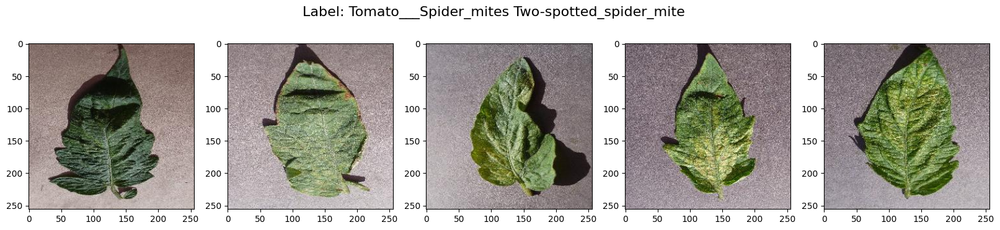

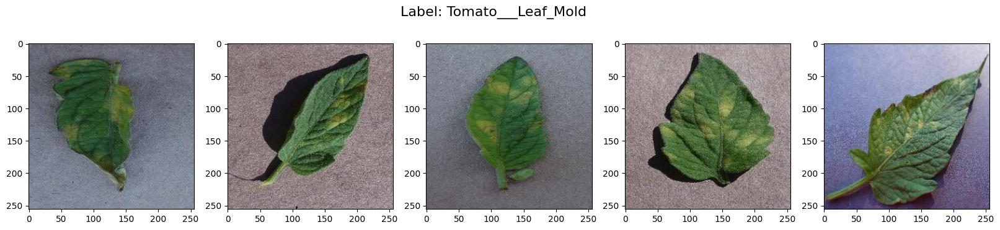

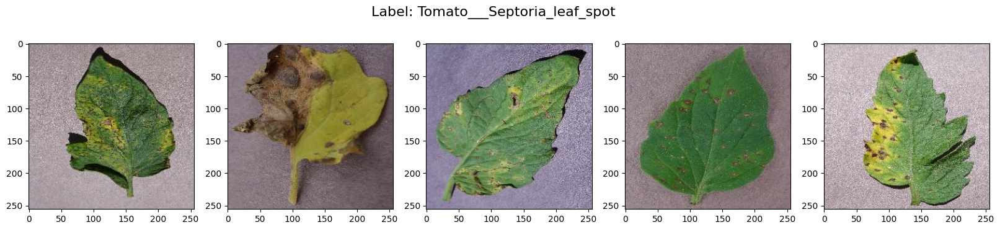

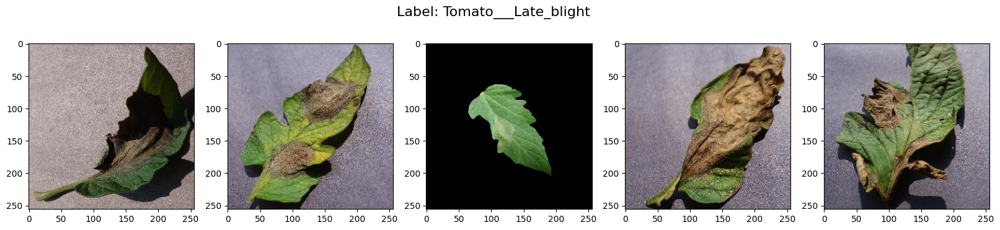

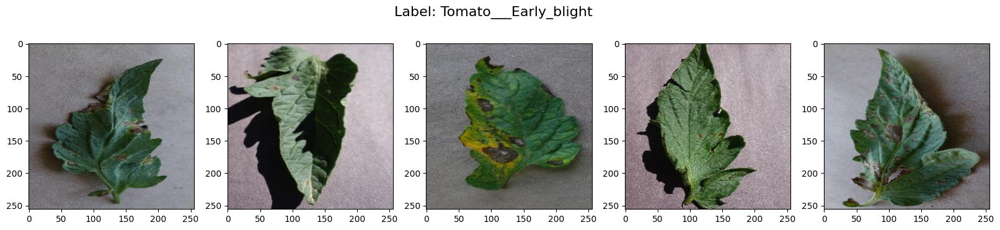

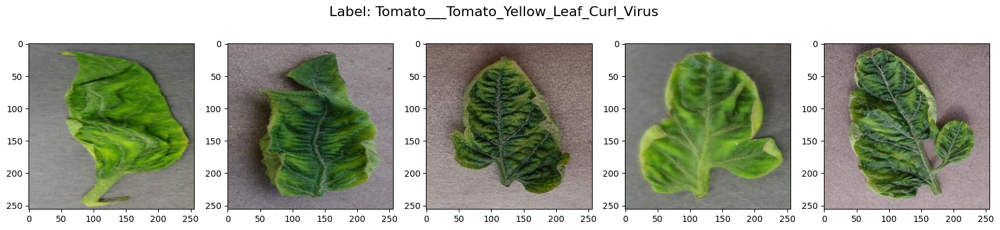

In [ ]:
def show_samples(data_dir, class_labels):
    for label in class_labels:
        # Get the path to the class folder
        class_dir = os.path.join(data_dir, label)

        # List all images in the class folder
        class_images = [f for f in os.listdir(class_dir) if os.path.isfile(os.path.join(class_dir, f))]

        # Display the first 5 image
        plt.figure(figsize=(20, 4))  # Set the figure size for each label
        plt.suptitle(f"Label: {label}", fontsize=16)  # Add label title above the row

        for i, img_name in enumerate(class_images[:5]):
            # Load and display the image
            img_path = os.path.join(class_dir, img_name)
            img = mpimg.imread(img_path)

            # Add subplot for each image
            plt.subplot(1, 5, i + 1)
            plt.imshow(img)
            plt.axis('on')

        # Show the row of images for this label
        plt.show()

# Display samples from the training directory
show_samples(train_dir, class_labels)

In [ ]:
def get_image_dimensions(image_path):
    """
    Gets the dimensions (width, height) of an image.

    Args:
        image_path: Path to the image file.

    Returns:
        Tuple: (width, height) of the image.
    """
    with Image.open(image_path) as img:
        width, height = img.size
    return width, height

all_dimensions = []

for class_label in class_labels:
    class_dir = os.path.join(train_dir, class_label)  # Use train_dir or any other directory
    for image_name in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_name)
        width, height = get_image_dimensions(image_path)
        all_dimensions.append((width, height))

# Convert dimensions to a NumPy array for easier analysis
all_dimensions = np.array(all_dimensions)

# Calculate min and max width and height
min_width = np.min(all_dimensions[:, 0])
max_width = np.max(all_dimensions[:, 0])
min_height = np.min(all_dimensions[:, 1])
max_height = np.max(all_dimensions[:, 1])

# Print the results
print(f"Minimum width: {min_width}")
print(f"Maximum width: {max_width}")
print(f"Minimum height: {min_height}")
print(f"Maximum height: {max_height}")

Minimum width: 256
Maximum width: 256
Minimum height: 256
Maximum height: 256


# Data Preparation

In [ ]:
# Image size and batch size
IMG_SIZE = (224, 224)
BATCH_SIZE = 64

In [ ]:
# Load datasets
train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    train_dir,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True,
    label_mode='categorical',
    seed=42
)
val_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    val_dir,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False,
    label_mode='categorical',
    seed=42
)
test_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    test_dir,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False,
    label_mode='categorical',
    seed=42
)

Found 10000 files belonging to 10 classes.
Found 900 files belonging to 10 classes.
Found 100 files belonging to 10 classes.


In [ ]:
# Prefetching
AUTOTUNE = tf.data.AUTOTUNE
train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
val_dataset = val_dataset.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)

# Model Architechture

In [ ]:
# Load InceptionV3
pre_trained_model = InceptionV3(input_shape=(224, 224, 3), include_top=False, weights="imagenet")
pre_trained_model.trainable = False  # Freeze layers

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [ ]:
pre_trained_model.summary()

Model: "inception_v3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 111, 111, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 111, 111, 32)   │             96 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 111, 111, 32)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 109, 109, 32)   │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 109, 109, 32)   │             96 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 109, 109, 32)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 109, 109, 64)   │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 109, 109, 64)   │            192 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 109, 109, 64)   │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 54, 54, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 54, 54, 80)     │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 54, 54, 80)     │            240 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 54, 54, 80)     │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 52, 52, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 52, 52, 192)    │            576 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_4 (Activat

 Total params: 21,802,784 (83.17 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 21,802,784 (83.17 MB)

In [ ]:
# Extract features from `mixed8`
last_layer = pre_trained_model.get_layer('mixed8')
last_output = last_layer.output

In [ ]:
# Build classifier
x = layers.Flatten()(last_output)
x = layers.Dense(1024, activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.2)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.2)(x)
x = layers.Dense(10, activation='softmax')(x)

# Assemble the model
model = models.Model(inputs=pre_trained_model.input, outputs=x)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 111, 111, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 111, 111, 32)   │             96 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 111, 111, 32)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 109, 109, 32)   │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 109, 109, 32)   │             96 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 109, 109, 32)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 109, 109, 64)   │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 109, 109, 64)   │            192 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 109, 109, 64)   │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 54, 54, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 54, 54, 80)     │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 54, 54, 80)     │            240 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 54, 54, 80)     │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 52, 52, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 52, 52, 192)    │            576 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_4 (Activat

 Total params: 43,979,946 (167.77 MB)

 Trainable params: 33,302,026 (127.04 MB)

 Non-trainable params: 10,677,920 (40.73 MB)

In [ ]:
# Data Augmentation
data_augmentation = tf.keras.Sequential([
    layers.Rescaling(1./255),
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
    layers.RandomContrast(0.2),
    layers.RandomTranslation(0.2, 0.2)
])

In [ ]:
# Combine augmentation with the model
inputs = tf.keras.Input(shape=(224, 224, 3))
augmented_inputs = data_augmentation(inputs)
outputs = model(augmented_inputs)
model_with_aug = tf.keras.Model(inputs, outputs)

model_with_aug.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential (Sequential)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ functional_1 (Functional)            │ (None, 10)                  │      43,979,946 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 43,979,946 (167.77 MB)

 Trainable params: 33,302,026 (127.04 MB)

 Non-trainable params: 10,677,920 (40.73 MB)

In [ ]:
# Compile the model
base_learning_rate = 0.0001
model_with_aug.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
                       loss=tf.keras.losses.CategoricalCrossentropy(),
                       metrics=['accuracy'])

In [ ]:
# Custom accuracy-based stopping
class AccuracyThresholdCallback(tf.keras.callbacks.Callback):
    def __init__(self, target_accuracy):
        super().__init__()
        self.target_accuracy = target_accuracy

    def on_epoch_end(self, epoch, logs=None):
        if logs.get('accuracy') >= self.target_accuracy:  # Stop when target accuracy is reached
            print(f"\nReached {self.target_accuracy * 100}% accuracy. Stopping training!")
            self.model.stop_training = True

# Initialize callbacks
accuracy_callback = AccuracyThresholdCallback(target_accuracy=0.97)
early_stopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)

In [ ]:
# Use both callbacks
history = model_with_aug.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=20,
    verbose=2,
    callbacks=[accuracy_callback, early_stopping_callback]
)

Epoch 1/20
157/157 - 50s - 317ms/step - accuracy: 0.6394 - loss: 1.1223 - val_accuracy: 0.7578 - val_loss: 0.7058
Epoch 2/20
157/157 - 28s - 178ms/step - accuracy: 0.7907 - loss: 0.6304 - val_accuracy: 0.7844 - val_loss: 0.6332
Epoch 3/20
157/157 - 29s - 184ms/step - accuracy: 0.8178 - loss: 0.5352 - val_accuracy: 0.8500 - val_loss: 0.5121
Epoch 4/20
157/157 - 29s - 187ms/step - accuracy: 0.8453 - loss: 0.4537 - val_accuracy: 0.8556 - val_loss: 0.4664
Epoch 5/20
157/157 - 28s - 180ms/step - accuracy: 0.8580 - loss: 0.4175 - val_accuracy: 0.8633 - val_loss: 0.4322
Epoch 6/20
157/157 - 29s - 185ms/step - accuracy: 0.8663 - loss: 0.4005 - val_accuracy: 0.8633 - val_loss: 0.3931
Epoch 7/20
157/157 - 41s - 258ms/step - accuracy: 0.8785 - loss: 0.3541 - val_accuracy: 0.8833 - val_loss: 0.3394
Epoch 8/20
157/157 - 41s - 259ms/step - accuracy: 0.8827 - loss: 0.3500 - val_accuracy: 0.8767 - val_loss: 0.4025
Epoch 9/20
157/157 - 29s - 182ms/step - accuracy: 0.8882 - loss: 0.3249 - val_accuracy: 

In [ ]:
# Remove early stopping
history2 = model_with_aug.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=20,
    verbose=2,
    callbacks=[accuracy_callback]
)

Epoch 1/20
157/157 - 27s - 175ms/step - accuracy: 0.8975 - loss: 0.3018 - val_accuracy: 0.8978 - val_loss: 0.3343
Epoch 2/20
157/157 - 42s - 270ms/step - accuracy: 0.8990 - loss: 0.2957 - val_accuracy: 0.8778 - val_loss: 0.3471
Epoch 3/20
157/157 - 29s - 184ms/step - accuracy: 0.9022 - loss: 0.2815 - val_accuracy: 0.9022 - val_loss: 0.3257
Epoch 4/20
157/157 - 40s - 256ms/step - accuracy: 0.9000 - loss: 0.2829 - val_accuracy: 0.8933 - val_loss: 0.3278
Epoch 5/20
157/157 - 41s - 264ms/step - accuracy: 0.9057 - loss: 0.2737 - val_accuracy: 0.9078 - val_loss: 0.2967
Epoch 6/20
157/157 - 41s - 262ms/step - accuracy: 0.9117 - loss: 0.2584 - val_accuracy: 0.9278 - val_loss: 0.2355
Epoch 7/20
157/157 - 41s - 261ms/step - accuracy: 0.9070 - loss: 0.2619 - val_accuracy: 0.9133 - val_loss: 0.2448
Epoch 8/20
157/157 - 41s - 262ms/step - accuracy: 0.9131 - loss: 0.2523 - val_accuracy: 0.9278 - val_loss: 0.2287
Epoch 9/20
157/157 - 28s - 181ms/step - accuracy: 0.9153 - loss: 0.2501 - val_accuracy: 

# Evaluate Model

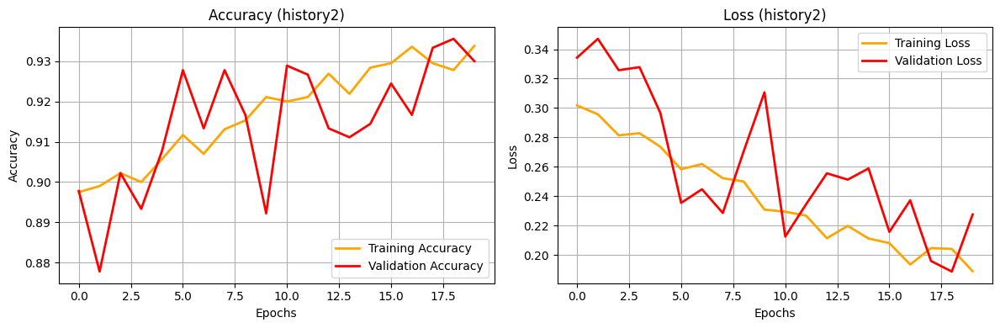

In [ ]:
# Plot accuracy and loss for history2
plt.figure(figsize=(12, 4))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history2.history['accuracy'], label='Training Accuracy', color='orange', linestyle='-', linewidth=2)
plt.plot(history2.history['val_accuracy'], label='Validation Accuracy', color='r', linestyle='-', linewidth=2)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Accuracy (history2)')
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history2.history['loss'], label='Training Loss', color='orange', linestyle='-', linewidth=2)
plt.plot(history2.history['val_loss'], label='Validation Loss', color='r', linestyle='-', linewidth=2)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.title('Loss (history2)')
plt.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
# Evaluate the model on the test dataset
test_loss, test_accuracy = model_with_aug.evaluate(test_dataset, verbose=2)

# Print the test loss and accuracy
print(f'Test Loss: {test_loss}')
print(f'Test Accuracy: {test_accuracy}')
print(f"Score: {test_accuracy * 100:.2f}%")

2/2 - 0s - 184ms/step - accuracy: 0.9100 - loss: 0.2485
Test Loss: 0.24846524000167847
Test Accuracy: 0.9100000262260437
Score: 91.00%


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


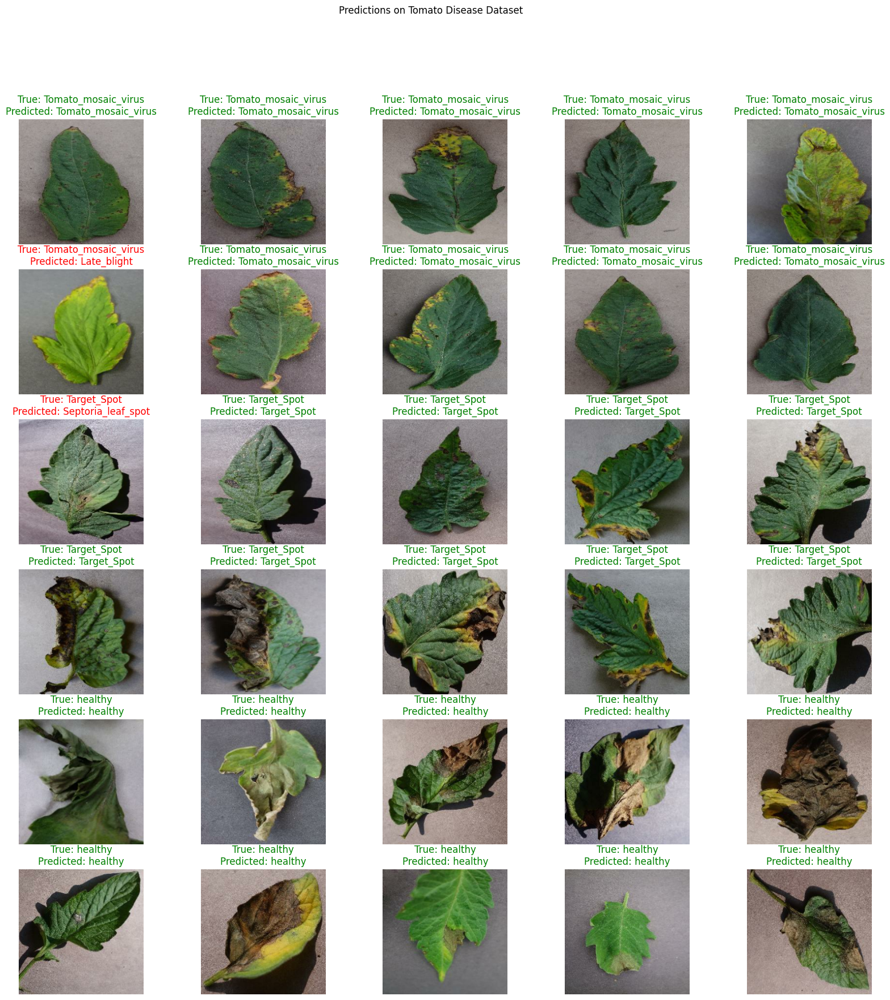

In [ ]:
# Corrected disease labels based on your provided order
disease_labels = [
    'Tomato_mosaic_virus',
    'Target_Spot',
    'healthy',
    'Bacterial_spot',
    'Spider_mites Two-spotted_spider_mite',
    'Leaf_Mold',
    'Septoria_leaf_spot',
    'Late_blight',
    'Early_blight',
    'Tomato_Yellow_Leaf_Curl_Virus'
]

# Function to get predictions and visualize
def get_predictions_and_visualize(model, test_dataset, disease_labels):
    all_true_labels = []
    all_predicted_labels = []
    all_images = []

    # Iterate through batches in the test set
    for image_batch, label_batch in test_dataset:
        # Make predictions on the batch
        predictions = model.predict(image_batch)

        # Convert predictions to class indices
        predicted_labels = np.argmax(predictions, axis=1)

        # Append the image batch, true labels, and predicted labels
        all_images.extend(image_batch.numpy())  # Convert tensor to numpy array
        all_true_labels.extend(np.argmax(label_batch, axis=1))  # Convert one-hot encoded labels to class indices
        all_predicted_labels.extend(predicted_labels)

        # Optionally break the loop after one full pass through the dataset if desired
        if len(all_images) > 30:  # Show only the first 30 images
            break

    # Plot the predictions
    plt.figure(figsize=(20, 20))
    plt.suptitle('Predictions on Tomato Disease Dataset')

    for i in range(min(30, len(all_images))):
        ax = plt.subplot(6, 5, i + 1)  # 6 rows, 5 columns of subplots
        color = 'green' if all_true_labels[i] == all_predicted_labels[i] else 'red'

        # Display the image
        plt.imshow(all_images[i].astype("uint8"))
        plt.axis('off')

        # Display the true and predicted class names using the correct disease_labels
        true_label_name = disease_labels[all_true_labels[i]]
        predicted_label_name = disease_labels[all_predicted_labels[i]]

        plt.title(f'True: {true_label_name}\nPredicted: {predicted_label_name}', color=color)

    plt.show()

# Example usage
get_predictions_and_visualize(model_with_aug, test_dataset, disease_labels)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


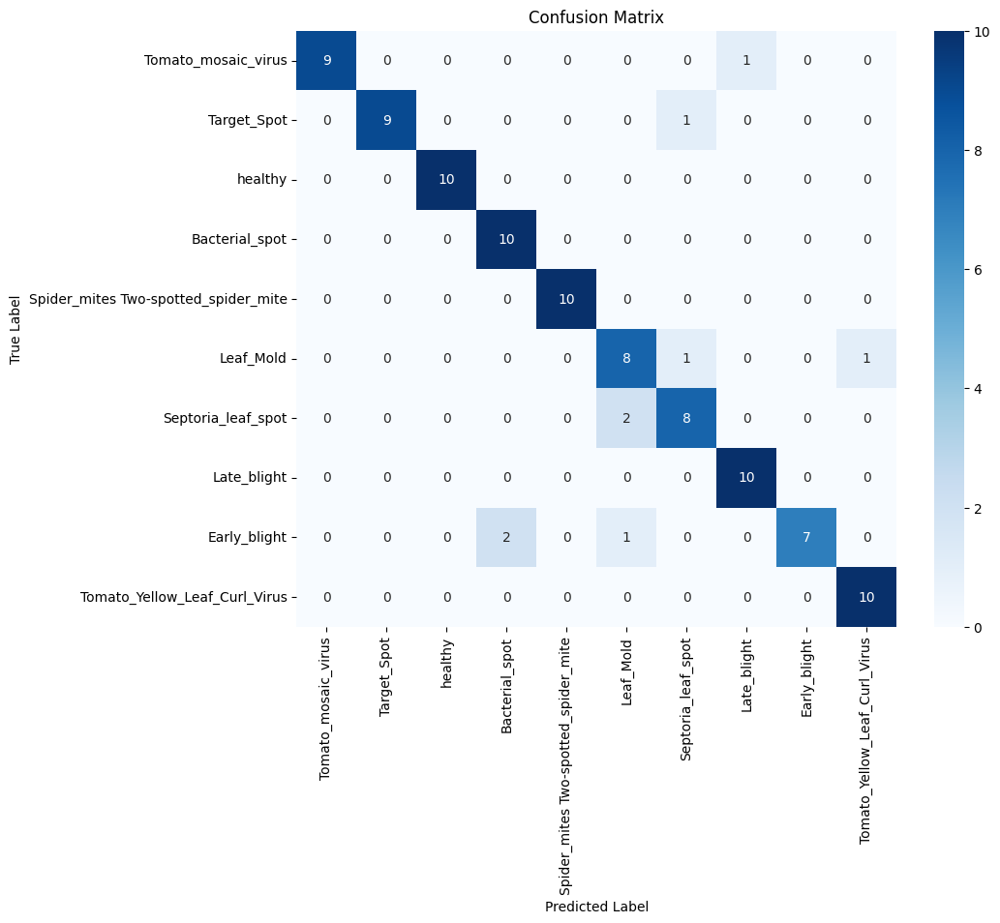

In [51]:
# Function to compute and plot confusion matrix
def eval_CM(y_true, y_pred, labels):
    # Compute the confusion matrix
    conf_matrix = confusion_matrix(y_true, y_pred)

    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

# Function to get true and predicted labels from the entire test dataset
def get_true_and_predicted_labels(model, test_dataset, disease_labels):
    all_true_labels = []
    all_predicted_labels = []

    # Iterate through batches in the test dataset
    for image_batch, label_batch in test_dataset:
        # Make predictions on the batch
        predictions = model.predict(image_batch)

        # Convert predictions to class indices
        predicted_labels = np.argmax(predictions, axis=1)

        # Append the true labels and predicted labels
        all_true_labels.extend(np.argmax(label_batch, axis=1))  # Convert one-hot encoded labels to class indices
        all_predicted_labels.extend(predicted_labels)

    return all_true_labels, all_predicted_labels

# Get true and predicted labels from the entire test dataset
y_true, y_pred = get_true_and_predicted_labels(model_with_aug, test_dataset, disease_labels)

# Call the eval_CM function to display the confusion matrix
eval_CM(y_true, y_pred, disease_labels)

# Save Model

In [ ]:
# Save the model to the specified path
model.save('/content/drive/MyDrive/Capstone/Inception_V3_Model/Tomato_InceptionV3.h5')
print("Model saved successfully to Google Drive!")

Model saved successfully to Google Drive!
